# Машинное обучение, ФКН ВШЭ

# Практическое задание 7. Бустинговое

## Общая информация

Дата выдачи: 13.12.2022

Мягкий дедлайн: 20.12.2022 23:59 MSK

Жёсткий дедлайн: 20.12.2022 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-07-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании вам предстоит вручную запрограммировать один из самых мощных алгоритмов машинного обучения — бустинг.

In [1]:
from warnings import filterwarnings

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.sparse import load_npz
from sklearn.model_selection import train_test_split


sns.set(style='darkgrid')
filterwarnings('ignore')

In [2]:
x = load_npz('x.npz')
y = np.load('y.npy')

Разделим на обучающую, валидационную и тестовую выборки (`random_state` оставьте равным 1337 для воспроизводимости).

In [3]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1337)

x_test, x_valid, y_test, y_valid = train_test_split(x_test, y_test, test_size=0.5, random_state=1337)

x_train.shape, x_valid.shape, x_test.shape

((18825, 169), (2354, 169), (2353, 169))

## Задание 1. Реализация градиентного бустингового (4 балла)

Вам нужно дописать код в файлике `boosting.py`. Для вас уже подготовлен шаблон класса `Boosting`, вы можете менять его по своему усмотрению.

### Инструкции для функций:

#### `__init__`

В `__init__` приходит кучка параметров, распишем что есть что:

 - `base_model_class` - класс базовой модели нашего бустинга
 - `base_model_params` - словарь с гиперпараметрами для базовой модели
 - `n_estimators` - какое количество базовых моделей нужно обучить
 - `learning_rate` - темп обучения, должен быть из полуинтервала $(0, 1]$
 - `subsample` - доля объектов, на которой будет обучаться базовая модель (какую часть составляет бутстрапная выборка от исходной обучающей)
 - `early_stopping_rounds` - число итераций, после которых при отсутствии улучшения качества на валидационной выборке обучение останавливается
 - `plot` - строить ли после обучения всех базовых моделей график с качеством

#### `fit`

В `fit` приходит две выборки, обучающая и валидационная. На обучающей мы обучаем новые базовые модели, на валидационной считаем качество для ранней остановки (если это предусматривают параметры).

Сначала нам нужно сделать какую-то нулевую модель, сделать предсказания для обучающей и валидационной выборок (в шаблоне это нулевая модель, соответственно предсказания это просто `np.zeros`). После этого нужно обучить `n_estimators` базовых моделей (как и на что обучаются базовые модели смотрите в лекциях и семинарах). После каждой обученной базовой модели мы должны обновить текущие предсказания, посчитать ошибку на обучающей и валидационной выборках (используем `loss_fn` для этого), проверить на раннюю остановку.

После всего цикла обучения надо нарисовать график (если `plot`).


#### `fit_new_base_model`

В `fit_new_base_model` приходит обучающая выборка (целиком) и текущие предсказания для неё. Мы должны сгенерировать бутстрап выборку для обучения базовой модели и обучить базовую модель. После обучения модели запускаем поиск оптимальной гаммы, добавляем новую модель и гамму (не забываем про темп обучения) в соответствующие списки.

#### `predict_proba`

В `predict_proba` приходит выборка, нужно предсказать вероятности для неё. Суммируем предсказания базовых моделей на этой выборке (не забываем про гаммы) и накидываем сигмоиду.

In [4]:
%load_ext autoreload

In [5]:
%autoreload 2

from boosting import Boosting

### Проверка кода

У автора задания всё учится около одной секунды.

In [6]:
boosting = Boosting()

%time boosting.fit(x_train, y_train, x_valid, y_valid)

assert len(boosting.models) == boosting.n_estimators
assert len(boosting.gammas) == boosting.n_estimators
assert boosting.predict_proba(x_test).shape == (x_test.shape[0], 2)

print(f'Train ROC-AUC {boosting.score(x_train, y_train):.4f}')
print(f'Valid ROC-AUC {boosting.score(x_valid, y_valid):.4f}')
print(f'Test ROC-AUC {boosting.score(x_test, y_test):.4f}')

CPU times: user 1.16 s, sys: 10.9 ms, total: 1.17 s
Wall time: 1.17 s
Train ROC-AUC 0.9892
Valid ROC-AUC 0.9149
Test ROC-AUC 0.9134


## Задание 2. Обучение градиентного бустингового (1 балл)

Оцените качество на тестовой выборке вашей имплементации бустинга для различной максимальной глубины решающего дерева в качестве базовой модели. Здесь и далее мы будем использовать метрику ROC-AUC.

Перебирайте максимальную глубину от 1 до 30 с шагом 2 (остальные параметры бустинга стоит оставить равными по умолчанию). Постройте график зависимости качества на обучающей и тестовой выборке в зависимости от глубины.

In [7]:
results = {
    'train_loss': [],
    'valid_loss': []
}

depths = range(1, 30, 2)

for depth in depths:
    boosting = Boosting(base_model_params={'max_depth': depth})
    boosting.fit(x_train, y_train, x_valid, y_valid)
    results['train_loss'].append(boosting.score(x_train, y_train))
    results['valid_loss'].append(boosting.score(x_valid, y_valid))

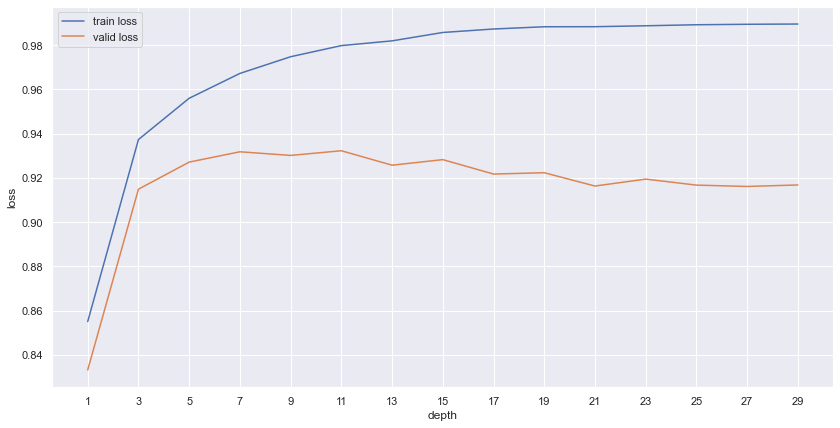

In [8]:
plt.figure(figsize=(14, 7))
plt.plot(depths, results['train_loss'], label='train loss')
plt.plot(depths, results['valid_loss'], label='valid loss')
plt.xticks(depths)
plt.xlabel('depth')
plt.ylabel('loss')
plt.legend()
plt.show()

**Какая из моделей имеет лучшее качество? Как вы можете это объяснить?**

`### ваше решение тут ###`

Ориентируясь на valid loss, видим, что при depth = ~11 у нас наилучшее качество, а дальше качество плавно идет на спад. При этом при большом параметре depth мы получаем почти идеальное качество на train, т.е переобучаемся. Вывод: оптимум где-то по середине, а деревья слишком большой глубины переобучаются и хуже ведут себя на valid выборке 

## Задание 3. Подбираем гиперпараметры и ищем лучшую модель (3 балла)

Подберите по валидационной выборке основные гиперпараметры для вашей модели бустинга. Следует подобрать все основные параметры для самого градиентного бустинга и для самих базовых моделей. Существуют библиотеки для подбора гиперпараметров, попробуйте использовать какую-нибудь из следующих двух - [Hyperopt](https://github.com/hyperopt/hyperopt), [Optuna](https://optuna.org/).

In [9]:
import optuna


# https://habr.com/ru/post/704432/  
def objective(trial):
    base_model_params_ =  {    
        'max_depth': trial.suggest_int('max_depth', 1, 30, 2),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20, 5),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
    }
    n_estimators_ = trial.suggest_int('n_estimators', 5, 20)
    learning_rate_ = trial.suggest_float('learning_rate', 0.01, 0.8)
    subsample_ = trial.suggest_float('subsample', 0.1, 0.9)
    early_stopping_rounds_ = trial.suggest_int('early_stopping_rounds', 5, 30, 5)
    
    model = Boosting(
        base_model_params=base_model_params_,
        n_estimators=n_estimators_,
        learning_rate=learning_rate_,
        subsample=subsample_,
        early_stopping_rounds=early_stopping_rounds_,
    )
    
    model.fit(x_train, y_train, x_valid, y_valid)
    return model.score(x_valid, y_valid)


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

study.best_params 

[I 2022-12-21 15:06:00,470] A new study created in memory with name: no-name-29dc8952-afb3-438e-93d9-febe95fafcf8
[I 2022-12-21 15:06:03,115] Trial 0 finished with value: 0.9279153725995406 and parameters: {'max_depth': 21, 'min_samples_split': 17, 'min_samples_leaf': 8, 'n_estimators': 16, 'learning_rate': 0.32878376132172266, 'subsample': 0.7430434018482407, 'early_stopping_rounds': 30}. Best is trial 0 with value: 0.9279153725995406.
[I 2022-12-21 15:06:04,458] Trial 1 finished with value: 0.9243083475610876 and parameters: {'max_depth': 25, 'min_samples_split': 17, 'min_samples_leaf': 3, 'n_estimators': 10, 'learning_rate': 0.6419061401299327, 'subsample': 0.5368265494264807, 'early_stopping_rounds': 10}. Best is trial 0 with value: 0.9279153725995406.
[I 2022-12-21 15:06:04,903] Trial 2 finished with value: 0.9318029617674501 and parameters: {'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 9, 'n_estimators': 6, 'learning_rate': 0.7933250572465411, 'subsample': 0.677817

[I 2022-12-21 15:06:37,805] Trial 24 finished with value: 0.9315367650756325 and parameters: {'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 6, 'n_estimators': 15, 'learning_rate': 0.564800311097665, 'subsample': 0.3737979259792892, 'early_stopping_rounds': 30}. Best is trial 16 with value: 0.9384606727313218.
[I 2022-12-21 15:06:40,031] Trial 25 finished with value: 0.9388485935475837 and parameters: {'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 4, 'n_estimators': 17, 'learning_rate': 0.3832921280463078, 'subsample': 0.8271549993338829, 'early_stopping_rounds': 25}. Best is trial 25 with value: 0.9388485935475837.
[I 2022-12-21 15:06:41,019] Trial 26 finished with value: 0.9343188597362937 and parameters: {'max_depth': 5, 'min_samples_split': 12, 'min_samples_leaf': 4, 'n_estimators': 17, 'learning_rate': 0.3597981937017328, 'subsample': 0.8212657191835442, 'early_stopping_rounds': 30}. Best is trial 25 with value: 0.9388485935475837.
[I 2022-12-21 15:06

[I 2022-12-21 15:07:18,718] Trial 49 finished with value: 0.8928308880752662 and parameters: {'max_depth': 1, 'min_samples_split': 2, 'min_samples_leaf': 3, 'n_estimators': 12, 'learning_rate': 0.448872062851374, 'subsample': 0.8524501957228087, 'early_stopping_rounds': 20}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 15:07:19,843] Trial 50 finished with value: 0.9370251262538583 and parameters: {'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 5, 'n_estimators': 15, 'learning_rate': 0.3874558086171564, 'subsample': 0.6930851105691093, 'early_stopping_rounds': 15}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 15:07:21,462] Trial 51 finished with value: 0.9378257118067611 and parameters: {'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 6, 'n_estimators': 18, 'learning_rate': 0.537241721346581, 'subsample': 0.8697255129570016, 'early_stopping_rounds': 25}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 15:07:23,

[I 2022-12-21 15:08:05,080] Trial 74 finished with value: 0.9370901788187253 and parameters: {'max_depth': 7, 'min_samples_split': 17, 'min_samples_leaf': 10, 'n_estimators': 20, 'learning_rate': 0.43120743993939226, 'subsample': 0.7763585417777408, 'early_stopping_rounds': 20}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 15:08:06,114] Trial 75 finished with value: 0.9346800411547269 and parameters: {'max_depth': 5, 'min_samples_split': 17, 'min_samples_leaf': 10, 'n_estimators': 19, 'learning_rate': 0.40135670574321863, 'subsample': 0.8606931343269625, 'early_stopping_rounds': 20}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 15:08:07,472] Trial 76 finished with value: 0.9385089632856095 and parameters: {'max_depth': 7, 'min_samples_split': 17, 'min_samples_leaf': 9, 'n_estimators': 20, 'learning_rate': 0.4864958988873374, 'subsample': 0.8132466709672727, 'early_stopping_rounds': 20}. Best is trial 32 with value: 0.9413864417683762.
[I 2022-12-21 1

[I 2022-12-21 15:08:43,030] Trial 99 finished with value: 0.9383848445882254 and parameters: {'max_depth': 7, 'min_samples_split': 2, 'min_samples_leaf': 5, 'n_estimators': 20, 'learning_rate': 0.5554027927610998, 'subsample': 0.7951065542820427, 'early_stopping_rounds': 15}. Best is trial 32 with value: 0.9413864417683762.


{'max_depth': 11,
 'min_samples_split': 12,
 'min_samples_leaf': 2,
 'n_estimators': 17,
 'learning_rate': 0.4059357666647254,
 'subsample': 0.8543660032812331,
 'early_stopping_rounds': 20}

In [10]:
res = study.best_params

base_model_params_ =  {    
    'max_depth': res['max_depth'],
    'min_samples_split': res['min_samples_split'],
    'min_samples_leaf': res['min_samples_leaf'],
}

boosting = Boosting(
        base_model_params=base_model_params_,
        n_estimators=res['n_estimators'],
        learning_rate=res['learning_rate'],
        subsample=res['subsample'],
        early_stopping_rounds=res['early_stopping_rounds'],
)
boosting.fit(x_train, y_train, x_valid, y_valid)

print(f'Train ROC-AUC {boosting.score(x_train, y_train):.4f}')
print(f'Valid ROC-AUC {boosting.score(x_valid, y_valid):.4f}')
print(f'Test ROC-AUC {boosting.score(x_test, y_test):.4f}')


Train ROC-AUC 0.9867
Valid ROC-AUC 0.9345
Test ROC-AUC 0.9338


## Задание 4. Интерпретация бустингового (2 балл)

Постройте калибровочную кривую для вашей лучшей модели бустинга. Насколько хорошо бустинг оценивает вероятности? Постройте также калибровочную кривую для логистической регрессии, сравните их между собой. Проанализируйте полученные результаты.

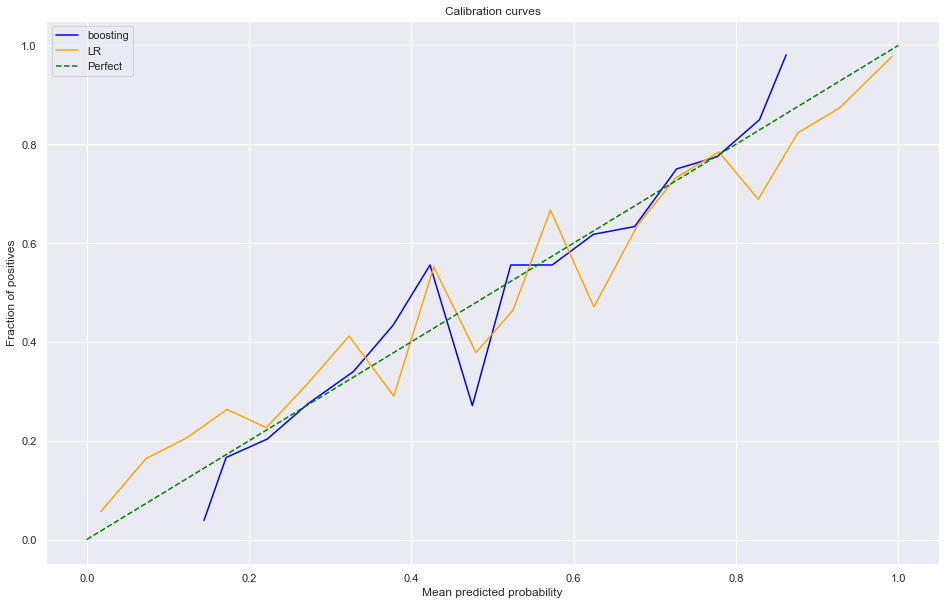

In [11]:
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV, calibration_curve

lr = LogisticRegression()
lr.fit(x_train, y_train)

lr_pred = lr.predict_proba(x_test)

b_pred = boosting.predict_proba(x_test)

plt.figure(figsize=(16, 10))
           
b_true_prob, b_pred_prob = calibration_curve(y_test, b_pred[:, 1], n_bins=20)
lr_true_prob, lr_pred_prob = calibration_curve(y_test, lr_pred[:, 1], n_bins=20)

plt.plot(b_pred_prob, b_true_prob, label='boosting', color='blue')
plt.plot(lr_pred_prob, lr_true_prob, label='LR', color='orange')
plt.plot([0, 1], [0, 1], label='Perfect', linestyle='--', color='green')

plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Calibration curves')
plt.legend()
plt.show()

Графики у LR и Boosting в целом крайне похожи друг на друга, в целом оба способа в данном случае достаточно хорошо оценивают вероятности.

Теперь попробуем оценить важность признаков для бустинга.

Поскольку наша базовая модель - это дерево из `sklearn`, мы можем вычислить важность признака отдельно для каждого дерева и усреднить (воспользуйтесь `feature_importances_` у `DecisionTreeRegressor`), после этого нормировать значения, чтобы они суммировались в единицу (обратите внимание, что они должны быть неотрицательными - иначе вы что-то сделали не так).

Допишите в вашей реализации бустинга функцию `feature_importances_` чтобы она возвращала описанные выше важности признаков.

Нарисуйте столбчатую диаграмму важности признаков. На соседнем графике нарисуйте важность признаков для логистической регрессии, для этого используйте модули весов. Сравните графики. Проанализируйте полученные результаты.

In [ ]:
# YOUR CODE:

Кстати, чаще всего излишние признаки могут вредить качеству бустинга. Попробуйте отфильтровать на основании диаграммы хвост наименее важных признаков и снова обучить модель (с теми же гиперпараметрами). Стало ли лучше?

In [ ]:
# YOUR CODE:

## Задание 5 (бонус). Блендинговое (1 балл)

Реализуйте блендинг над вашей лучшей моделью и логистической регрессией. Улучшилось ли качество?

In [ ]:
# YOUR CODE:

## Задание 6 (бонус). Катбустовое (1 балл)

Запустите [CatBoost](https://catboost.ai/en/docs/concepts/python-quickstart) на наших данных, сравните с вашей реализацией. Где получилось лучше?

In [12]:
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score

model = CatBoostClassifier(
    verbose=False
)

model.fit(x_train, y_train)

y_pred = model.predict(x_test)

roc_auc_score(y_pred, y_test)

0.8553939180462604

In [13]:
def objective(trial):
    model = CatBoostClassifier(
        max_depth=trial.suggest_int('max_depth', 1, 15, 2),
        n_estimators=trial.suggest_int('n_estimators', 5, 20),
        learning_rate=trial.suggest_float('learning_rate', 0.01, 0.8),
        verbose=False
    )
    
    model.fit(x_train, y_train)
    y_pred = model.predict(x_valid)
    return model.score(x_valid, y_valid)


study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

study.best_params 

[I 2022-12-21 15:09:25,284] A new study created in memory with name: no-name-1516f3a0-c087-4363-a742-4a502c59726e
[I 2022-12-21 15:09:30,765] Trial 0 finished with value: 0.87892948173322 and parameters: {'max_depth': 15, 'n_estimators': 14, 'learning_rate': 0.247656243522464}. Best is trial 0 with value: 0.87892948173322.
[I 2022-12-21 15:09:31,465] Trial 1 finished with value: 0.8717077315208156 and parameters: {'max_depth': 13, 'n_estimators': 9, 'learning_rate': 0.38204818818180436}. Best is trial 0 with value: 0.87892948173322.
[I 2022-12-21 15:09:31,517] Trial 2 finished with value: 0.8717077315208156 and parameters: {'max_depth': 3, 'n_estimators': 10, 'learning_rate': 0.7911353497880819}. Best is trial 0 with value: 0.87892948173322.
[I 2022-12-21 15:09:32,691] Trial 3 finished with value: 0.8751062022090059 and parameters: {'max_depth': 13, 'n_estimators': 14, 'learning_rate': 0.45801192872585195}. Best is trial 0 with value: 0.87892948173322.
[I 2022-12-21 15:09:32,749] Trial

[I 2022-12-21 15:10:04,381] Trial 36 finished with value: 0.8738317757009346 and parameters: {'max_depth': 5, 'n_estimators': 9, 'learning_rate': 0.5492301577121911}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:04,523] Trial 37 finished with value: 0.8814783347493628 and parameters: {'max_depth': 7, 'n_estimators': 20, 'learning_rate': 0.476653941062648}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:04,707] Trial 38 finished with value: 0.8759558198810535 and parameters: {'max_depth': 9, 'n_estimators': 18, 'learning_rate': 0.7167670771554289}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:04,779] Trial 39 finished with value: 0.8712829226847918 and parameters: {'max_depth': 3, 'n_estimators': 14, 'learning_rate': 0.5966632163019364}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:04,962] Trial 40 finished with value: 0.8819031435853866 and parameters: {'max_depth': 11, 'n_estimators': 7, 'lea

[I 2022-12-21 15:10:13,770] Trial 72 finished with value: 0.8734069668649108 and parameters: {'max_depth': 3, 'n_estimators': 20, 'learning_rate': 0.6045976043795025}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:13,882] Trial 73 finished with value: 0.8827527612574342 and parameters: {'max_depth': 5, 'n_estimators': 20, 'learning_rate': 0.5406222537419465}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:14,010] Trial 74 finished with value: 0.8780798640611724 and parameters: {'max_depth': 5, 'n_estimators': 20, 'learning_rate': 0.5005648285862264}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:14,118] Trial 75 finished with value: 0.872982158028887 and parameters: {'max_depth': 3, 'n_estimators': 18, 'learning_rate': 0.5426072303065627}. Best is trial 21 with value: 0.8857264231096007.
[I 2022-12-21 15:10:14,246] Trial 76 finished with value: 0.8768054375531011 and parameters: {'max_depth': 5, 'n_estimators': 19, 'le

{'max_depth': 7, 'n_estimators': 20, 'learning_rate': 0.5575752456329486}

In [14]:
model = CatBoostClassifier(
    max_depth=7,
    n_estimators=18,
    learning_rate=0.6509027941062416,
    verbose=False
)

model.fit(x_train, y_train)

y_pred = model.predict(x_test)

roc_auc_score(y_pred, y_test)

0.8576594286396984

CatBoost здесь работает сильно хуже, а подбор некоторых гиперпараметров с помощью той же optuna не особо сильно изменил точность (почти что никак).

## Социализационный бонус. Новогоднее 🎆 (0.5 балла)

Сфотографируйтесь с наряженной новогодней или рождественской ёлкой! Приложите фотографию, опишите свои впечатления, чего вы ждете от нового 2023 года?

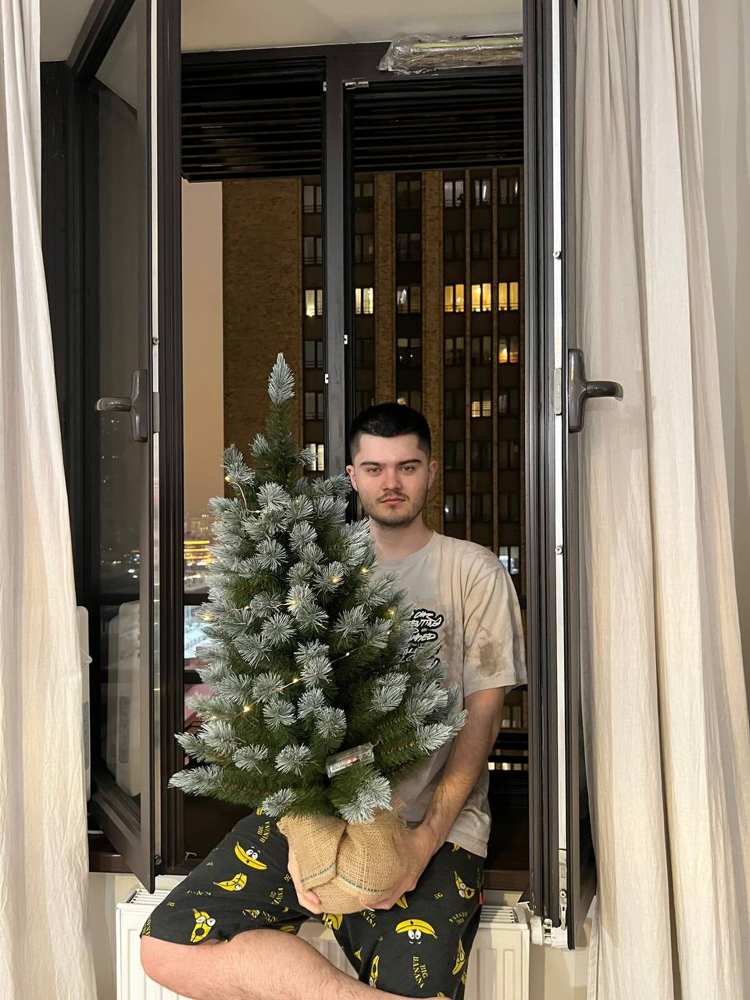

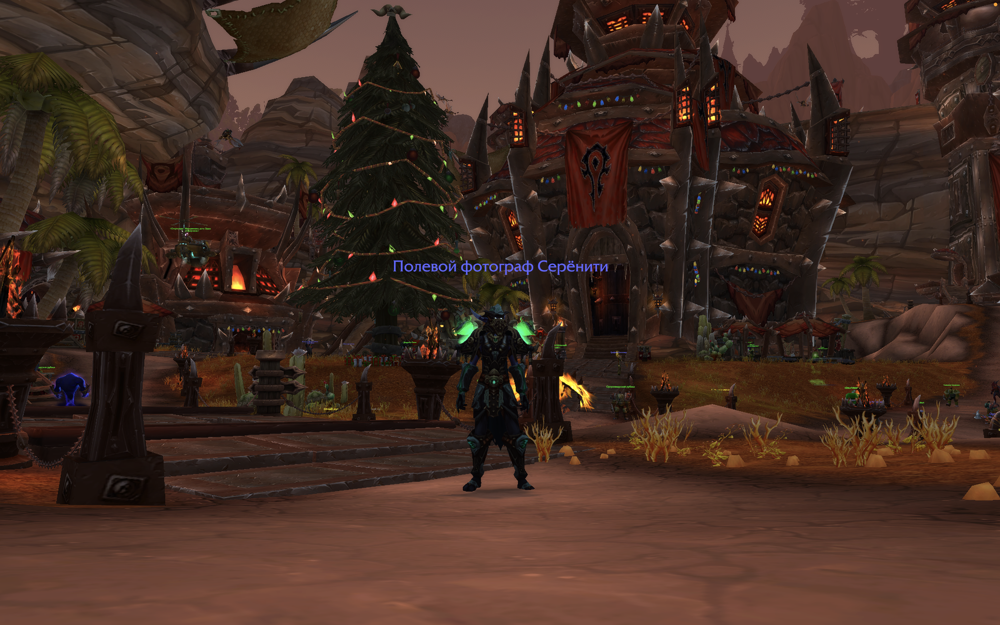

От 2023 жду быть не 2022, большего не надо